<a href="https://colab.research.google.com/github/newcave/230413_Mebrane_SEM_Image_Analysis_010/blob/main/230413_Mebrane_SEM_Image_Analysis_101.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pwd

'/content'


# **3개의 threshold 값에 대해서 현재 까지 합친 버전**

---



THRESHOLD OF PORE REPRESENTATION: 50
diff1:===>> 0.899251583189407
diff2:===>> 0.9314910765687967
diff3:===>> 0.9136442141623489
diff4:===>> 0.7507196315486471


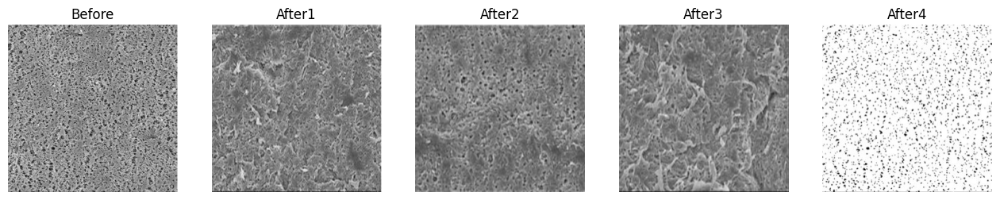

<ipython-input-3-3e57dbd93981>:163: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro-" (-> color='r'). The keyword argument will take precedence.
  axes[1].plot(x_diff, y_diff, 'ro-', label='Difference', color='black')


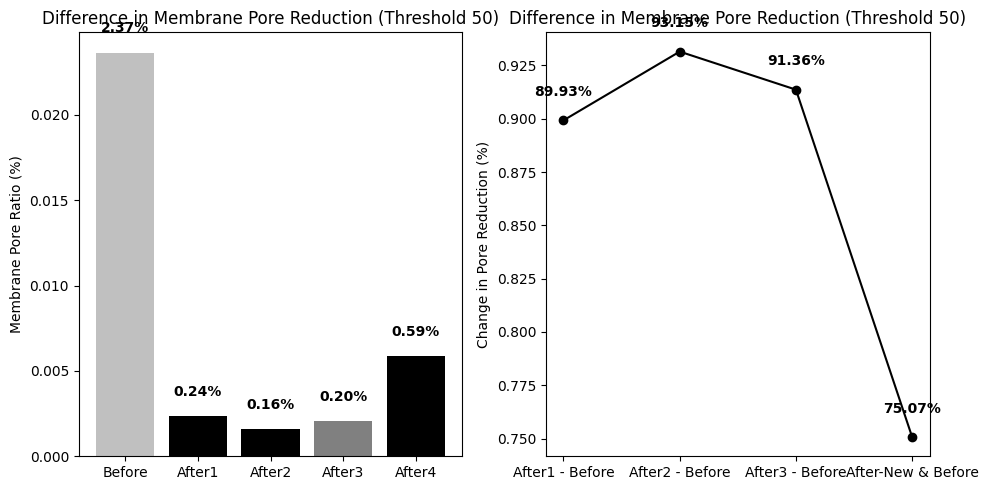

threshold===== 50 was treated
THRESHOLD OF PORE REPRESENTATION: 60
diff1:===>> 0.8682198762286131
diff2:===>> 0.9020749908991627
diff3:===>> 0.900618856934838
diff4:===>> 0.7921368765926465


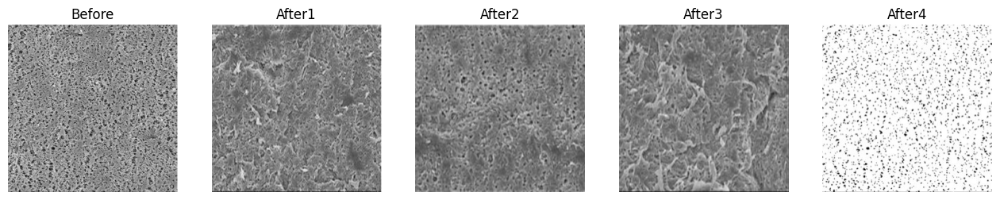

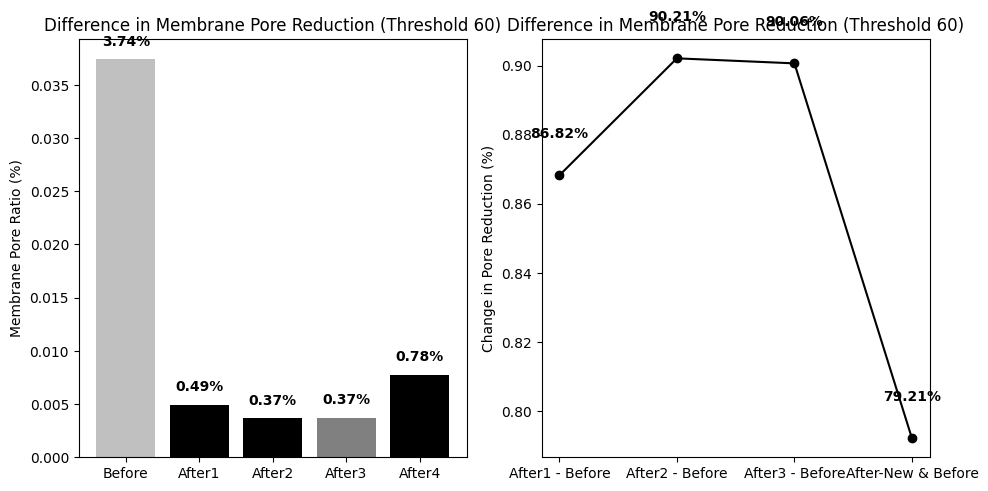

threshold===== 60 was treated
THRESHOLD OF PORE REPRESENTATION: 70
diff1:===>> 0.8236151603498542
diff2:===>> 0.8551992225461614
diff3:===>> 0.8828960155490768
diff4:===>> 0.8226433430515063


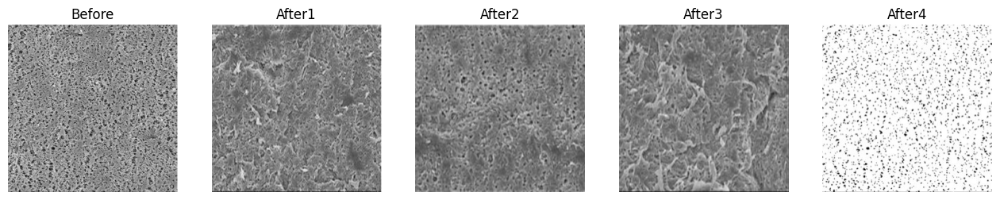

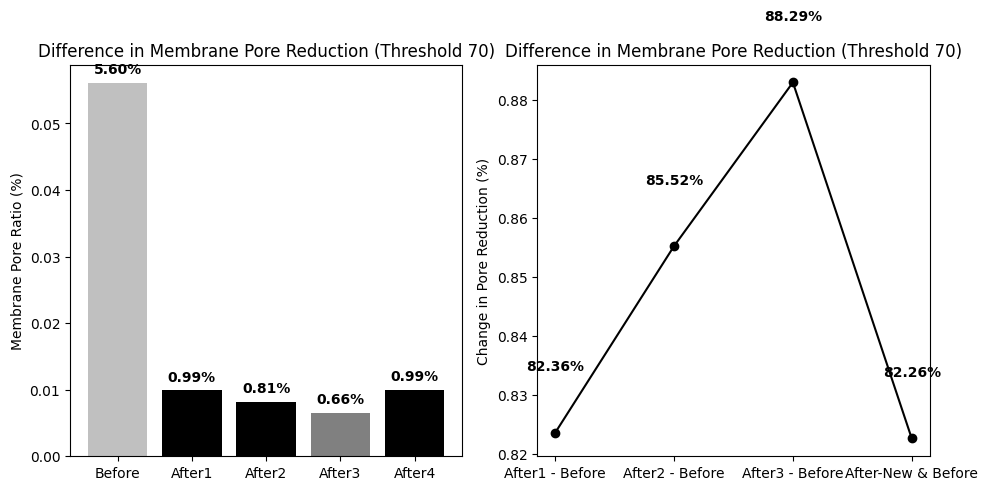

threshold===== 70 was treated
THRESHOLD OF PORE REPRESENTATION: 80
diff1:===>> 0.7259804761089227
diff2:===>> 0.7705086487412228
diff3:===>> 0.8177770166124336
diff4:===>> 0.839527316321288


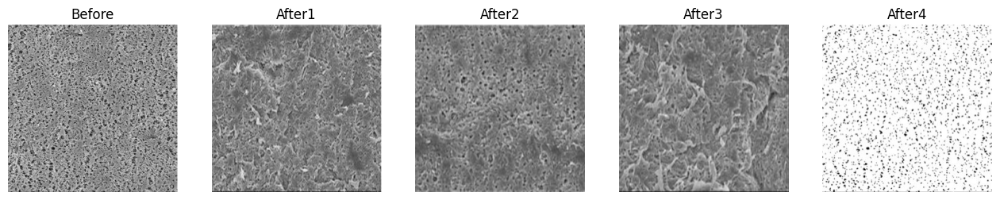

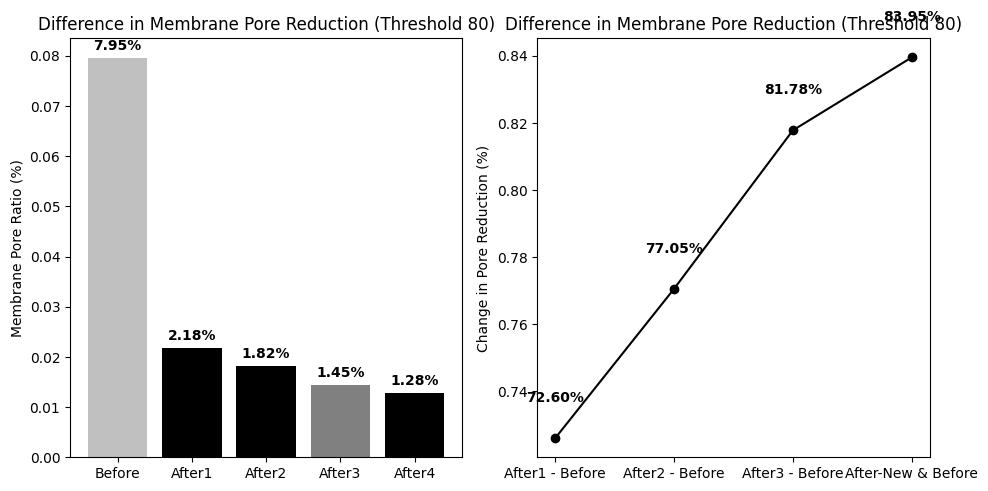

threshold===== 80 was treated
THRESHOLD OF PORE REPRESENTATION: 90
diff1:===>> 0.5098549646708813
diff2:===>> 0.5316722449485558
diff3:===>> 0.6700136358001735
diff4:===>> 0.8536010908640138


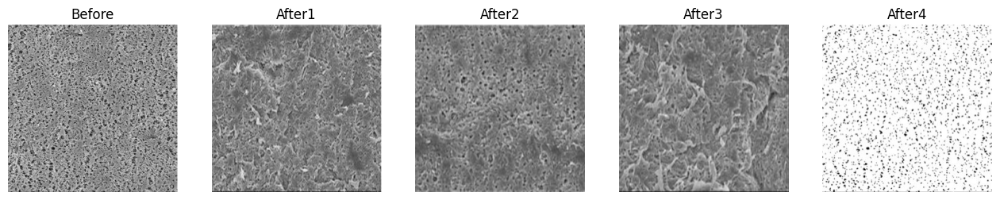

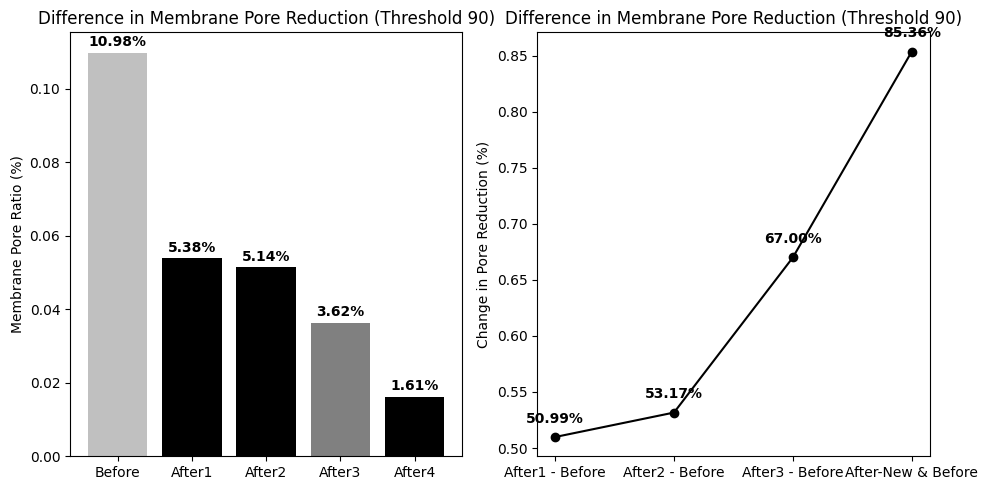

threshold===== 90 was treated
THRESHOLD OF PORE REPRESENTATION: 100
diff1:===>> 0.1363178613933901
diff2:===>> 0.1128810766273001
diff3:===>> 0.3372699807745125
diff4:===>> 0.8657877872379384


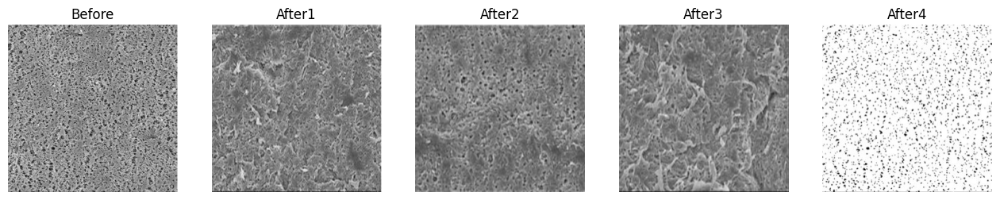

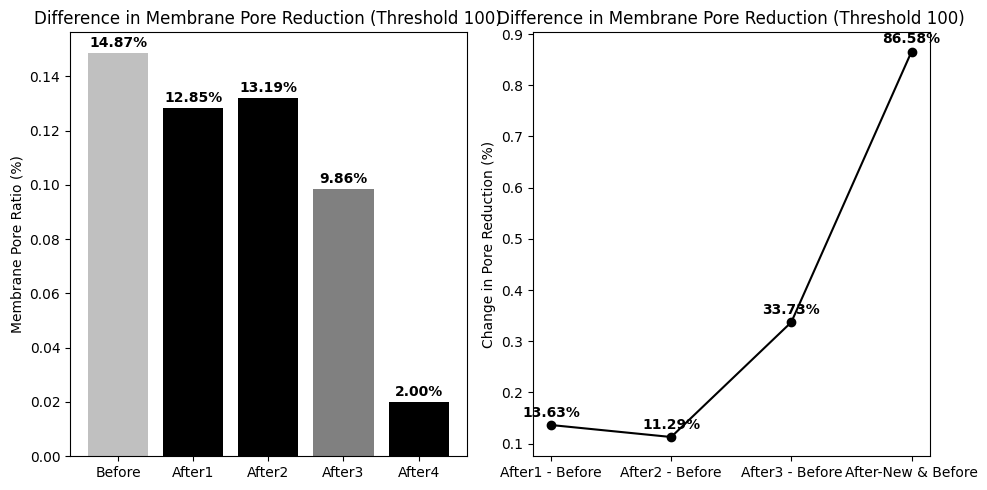

threshold===== 100 was treated


In [ ]:

#################### 3개의 threshold 값에 대해서 현재 까지 합친 버전 

# from PIL import Image # 반전이미지 처리를 위한 ImageOps 추가 
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import numpy as np

# 검은색 농도의 임계값 리스트
thresholds = [50, 60, 70, 80, 90, 100]
#thresholds = [50, 60, 70, 80, 128, 150, 200, 250]
#thresholds = [110, 128, 150]


def main():
    # 각 임계값에 대해 이미지 처리 및 출력
    for threshold in thresholds:
        process_images(threshold)

def process_images(threshold):
     # 이미지 파일 열기
    img1 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/img_org.png')
    img2 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image01.png')
    img3 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image02.png')
    img4 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image03.png')
    img5 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/new_mem_rev.png')

    #img3 = ImageOps.invert(img2)
    #img5 = ImageOps.invert(img5)

    # 이미지 크기 맞추기
    width, height = img1.size
    img2 = img2.resize((width, height))
    img3 = img3.resize((width, height))
    img4 = img4.resize((width, height))
    img5 = img5.resize((width, height))


    # 검은색 농도의 임계값 설정
    print("THRESHOLD OF PORE REPRESENTATION:", threshold)

   # 검은색 픽셀 수
    black_pixels1 = 0
    black_pixels2 = 0
    black_pixels3 = 0
    black_pixels4 = 0
    black_pixels5 = 0
    count = 0 

    for x in range(width):
      for y in range(height):

     # 해당 픽셀의 RGB 값을 가져오기
        r1, g1, b1 = img1.getpixel((x, y))
        r2, g2, b2 = img2.getpixel((x, y))
        r3, g3, b3 = img3.getpixel((x, y))
        r4, g4, b4 = img4.getpixel((x, y))
        r5, g5, b5 = img5.getpixel((x, y))
    
    # RGB 값을 평균하여 밝기 계산하기
    brightness1 = (r1 + g1 + b1) / 3
    brightness2 = (r2 + g2 + b2) / 3
    brightness3 = (r3 + g3 + b3) / 3
    brightness4 = (r4 + g4 + b4) / 3
    brightness5 = (r5 + g5 + b5) / 3

    
    # # 검은색 농도가 임계값 이상인 경우 black_pixels 값을 증가시킴
    # if brightness1 >= threshold:
    #     black_pixels1 += 1
    # if brightness2 >= threshold:
    #     black_pixels2 += 1
    # if brightness3 >= threshold:
    #     black_pixels3 += 1
    # if brightness4 >= threshold:
    #     black_pixels4 += 1
    # if brightness4 >= threshold:
    #     black_pixels5 += 1

    black_pixels1 = sum([1 for pixel in img1.getdata() if sum(pixel)/3 <= threshold])
    black_pixels2 = sum([1 for pixel in img2.getdata() if sum(pixel)/3 <= threshold])
    black_pixels3 = sum([1 for pixel in img3.getdata() if sum(pixel)/3 <= threshold])
    black_pixels4 = sum([1 for pixel in img4.getdata() if sum(pixel)/3 <= threshold])
    black_pixels5 = sum([1 for pixel in img5.getdata() if sum(pixel)/3 <= threshold])
    
    #각 이미지의 픽셀 수 계산
    count1 = img1.size[0] * img1.size[1]
    count2 = img2.size[0] * img2.size[1]
    count3 = img3.size[0] * img3.size[1]
    count4 = img4.size[0] * img4.size[1]
    count5 = img5.size[0] * img5.size[1]


    # 각 이미지의 검은색 비율 계산
    black_ratio1 = black_pixels1 / count1
    black_ratio2 = black_pixels2 / count2
    black_ratio3 = black_pixels3 / count3
    black_ratio4 = black_pixels4 / count4    
    black_ratio5 = black_pixels5 / count5


    # 공극 비율 차이 계산하기
    black_ratio_diff1 = (black_ratio1 - black_ratio2)/black_ratio1
    black_ratio_diff2 = (black_ratio1 - black_ratio3)/black_ratio1
    black_ratio_diff3 = (black_ratio1 - black_ratio4)/black_ratio1
    black_ratio_diff4 = (black_ratio1 - black_ratio5)/black_ratio1

    for i in range(4):
        if i == 0:
            diff = black_ratio_diff1
        elif i == 1:
            diff = black_ratio_diff2
        elif i == 2:
            diff = black_ratio_diff3
        else:
            diff = black_ratio_diff4
        print(f"diff{i+1}:===>> {diff}")

    # 이미지 그리기
    img_list = [img1, img2, img3, img4, img5]
    black_ratios = [black_ratio1, black_ratio2, black_ratio3, black_ratio4, black_ratio5]
    black_ratio_diffs = [black_ratio_diff1, black_ratio_diff2, black_ratio_diff3, black_ratio_diff4]
    plot_images(img_list, black_ratios, black_ratio_diffs, threshold)
    print(f"threshold===== {threshold} was treated")

def plot_images(img_list, black_ratios, black_ratio_diffs, threshold):
    fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(16, 5))

    for i, img in enumerate(img_list):
        axes[i].imshow(img)
        axes[i].set_title(f"After{i}" if i > 0 else "Before")
        axes[i].axis("off")

    plt.show()

#########################
#비교 차트 부분 - 뒤 코드에 
#########################

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

    # 차트1: 막대 차트 그리기
    x = np.arange(5)
    y = np.array(black_ratios)
    labels = ['Before', 'After1', 'After2', 'After3', 'After4']
    colors = ['#C0C0C0', 'black', 'black', 'gray', 'black']

    axes[0].bar(x, y, color=colors)
    axes[0].set_xticks(x)
    axes[0].set_xticklabels(labels)
    axes[0].set_ylabel('Membrane Pore Ratio (%)')
    axes[0].set_title(f'Difference in Membrane Pore Reduction (Threshold {threshold})')

    # 막대 차트에 텍스트 삽입
    for i, val in enumerate(y):
            axes[0].text(i, val+0.001, "{:.2f}%".format(val * 100), ha='center', va='bottom', fontweight='bold')

    # 차트2: 차이값을 나타내는 선 그래프 그리기
    x_diff = np.arange(4)
    y_diff = np.array(black_ratio_diffs)
    labels_diff = ['After1 - Before', 'After2 - Before', 'After3 - Before', 'After-New & Before']
    colors_diff = ['black', 'black', 'gray','black']

    axes[1].plot(x_diff, y_diff, 'ro-', label='Difference', color='black')
    axes[1].set_xticks(x_diff)
    axes[1].set_xticklabels(labels_diff)
    axes[1].set_ylabel('Change in Pore Reduction (%)')
    axes[1].set_title(f'Difference in Membrane Pore Reduction (Threshold {threshold})')


    # 차트2에 텍스트 삽입
    for i, diff in enumerate(y_diff):
        axes[1].text(i, diff+0.01, "{:.2f}%".format(diff * 100), ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()
    plt.show()


if __name__ == "__main__":
    main()


thresholds = range(128, 151)
로 하고 전체적인 평균값을 계산하도록 수정하고자 합니다 #001

# **thresholds = range(128, 151)**
# **로 하고 전체적인 평균값을 계산하도록 수정**

THRESHOLD OF PORE REPRESENTATION: 50
Threshold 50: Average difference: 0.9147956246401842
Threshold 50: initial Pore Estimated Value for New Membrane == 2.3652926998651904 %
THRESHOLD OF PORE REPRESENTATION: 51
Threshold 51: Average difference: 0.9127553837658752
Threshold 51: initial Pore Estimated Value for New Membrane == 2.4660593433827636 %
THRESHOLD OF PORE REPRESENTATION: 52
Threshold 52: Average difference: 0.9117905464768934
Threshold 52: initial Pore Estimated Value for New Membrane == 2.5831665236869696 %
THRESHOLD OF PORE REPRESENTATION: 53
Threshold 53: Average difference: 0.9072026800670017
Threshold 53: initial Pore Estimated Value for New Membrane == 2.709805683783379 %
THRESHOLD OF PORE REPRESENTATION: 54
Threshold 54: Average difference: 0.9032051282051282
Threshold 54: initial Pore Estimated Value for New Membrane == 2.83235970968313 %
THRESHOLD OF PORE REPRESENTATION: 55
Threshold 55: Average difference: 0.9009297363206829
Threshold 55: initial Pore Estimated Value 

<ipython-input-8-b2442540de9a>:55: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro-" (-> color='r'). The keyword argument will take precedence.
  ax.plot(x, y, 'ro-', label='Average Difference', color='black', alpha=0.5)
<ipython-input-8-b2442540de9a>:56: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo-" (-> color='b'). The keyword argument will take precedence.
  ax.plot(x, y1, 'bo-', label='After1 Difference', color='blue', alpha=0.5)
<ipython-input-8-b2442540de9a>:57: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go-" (-> color='g'). The keyword argument will take precedence.
  ax.plot(x, y2, 'go-', label='After2 Difference', color='green', alpha=0.5)
<ipython-input-8-b2442540de9a>:58: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "yo-" (-> color='y'). The keyword argument will take precedence

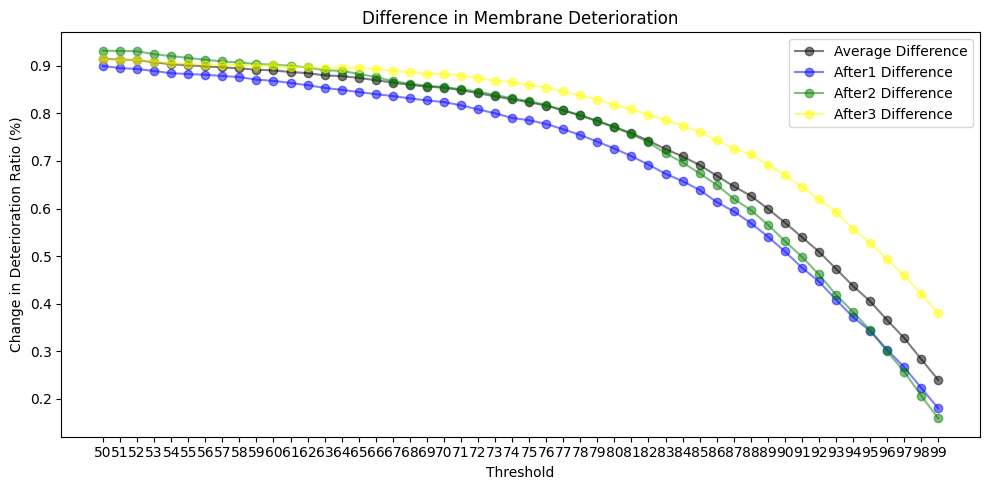

ValueError: ignored

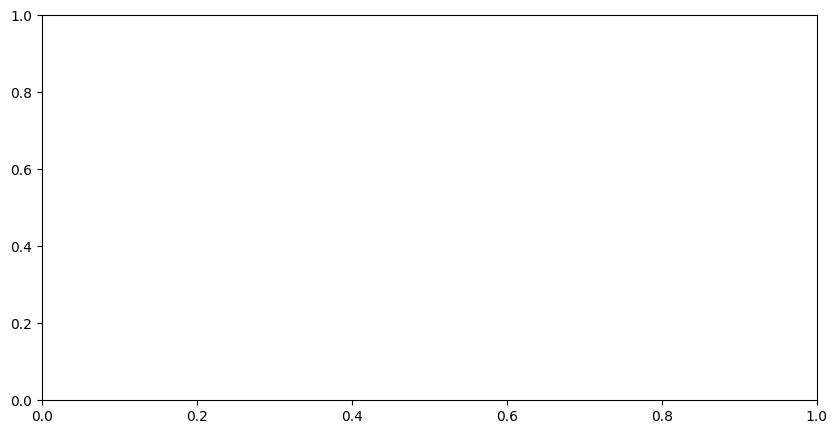

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# 이미지 파일 열기
img1 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/img_org.png')
img2 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image01.png')
img3 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image02.png')
img4 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image03.png')

# 이미지 크기 맞추기
width, height = img1.size
img2 = img2.resize((width, height))
img3 = img3.resize((width, height))
img4 = img4.resize((width, height))

thresholds = range(50, 100)
average_diffs = []
average_diffs1 = []
average_diffs2 = []
average_diffs3 = []
#
initial_pore_ratios = []

for threshold in thresholds:
#    initial_pore_ratios.append(black_ratios[0])
    print("THRESHOLD OF PORE REPRESENTATION:", threshold)
    black_ratios = []
    # Add this line inside the loop, after calculating black_ratios
#
    for img in [img1, img2, img3, img4]:
        black_pixels = sum([1 for pixel in img.getdata() if sum(pixel)/3 <= threshold])
        count = img.size[0] * img.size[1]
        black_ratios.append(black_pixels / count)

    # 검은색 비율 차이 계산하기(처리효율 개념으로 가정만)
    black_ratio_diffs = [(black_ratios[0] - black_ratios[i])/(black_ratios[0]) for i in range(1, 4)]
    average_diff = sum(black_ratio_diffs) / 3
    average_diffs.append(average_diff)
    average_diffs1.append(black_ratio_diffs[0])
    average_diffs2.append(black_ratio_diffs[1])
    average_diffs3.append(black_ratio_diffs[2])
    print(f"Threshold {threshold}: Average difference: {average_diff}")
    print(f"Threshold {threshold}: initial Pore Estimated Value for New Membrane == {(black_ratios[0])*100} %")

# 차이값을 나타내는 선 그래프 그리기
fig, ax = plt.subplots(figsize=(10, 5))

x = np.arange(len(thresholds))
y = np.array(average_diffs)
y1 = np.array(average_diffs1)
y2 = np.array(average_diffs2)
y3 = np.array(average_diffs3)

ax.plot(x, y, 'ro-', label='Average Difference', color='black', alpha=0.5)
ax.plot(x, y1, 'bo-', label='After1 Difference', color='blue', alpha=0.5)
ax.plot(x, y2, 'go-', label='After2 Difference', color='green', alpha=0.5)
ax.plot(x, y3, 'yo-', label='After3 Difference', color='yellow', alpha=0.5)

ax.set_xticks(x)
ax.set_xticklabels(thresholds)
ax.set_xlabel('Threshold')
ax.set_ylabel('Change in Deterioration Ratio (%)')
ax.set_title('Difference in Membrane Deterioration')
ax.legend()

plt.tight_layout()
plt.show()

#### 추가버전
#### 초기의 공극비율을 판단하는 그래프를 추가함 
fig, ax = plt.subplots(figsize=(10, 5))
xp = np.arange(len(thresholds))
#yp = np.array(black_ratios[0])
yp = (np.array(initial_pore_ratios))*100


ax.plot(xp, yp, 'o-', label='Initial Pore', color='blue', alpha=0.5)

ax.set_xlabel('Thresholds')
ax.set_ylabel('Pore Ratios')
ax.set_title('Initial Pore Estimation for New Membrane')

ax.set_xticks(xp)
ax.set_xticklabels(thresholds)

plt.tight_layout()
plt.show()
####|





THRESHOLD OF PORE REPRESENTATION: 50
Threshold 50: Average difference: -0.021271062066915664
THRESHOLD OF PORE REPRESENTATION: 51
Threshold 51: Average difference: -0.02216178521617858
THRESHOLD OF PORE REPRESENTATION: 52
Threshold 52: Average difference: -0.023078211822522555
THRESHOLD OF PORE REPRESENTATION: 53
Threshold 53: Average difference: -0.02417761625198031
THRESHOLD OF PORE REPRESENTATION: 54
Threshold 54: Average difference: -0.0252681474846157
THRESHOLD OF PORE REPRESENTATION: 55
Threshold 55: Average difference: -0.0263277137024632
THRESHOLD OF PORE REPRESENTATION: 56
Threshold 56: Average difference: -0.027653801169590677
THRESHOLD OF PORE REPRESENTATION: 57
Threshold 57: Average difference: -0.028872866626376767
THRESHOLD OF PORE REPRESENTATION: 58
Threshold 58: Average difference: -0.030090637842706765
THRESHOLD OF PORE REPRESENTATION: 59
Threshold 59: Average difference: -0.03145762265888562


<ipython-input-6-21b6cf55ca89>:50: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro-" (-> color='r'). The keyword argument will take precedence.
  ax.plot(x, y, 'ro-', label='Average Difference', color='black', alpha=0.5)
<ipython-input-6-21b6cf55ca89>:51: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo-" (-> color='b'). The keyword argument will take precedence.
  ax.plot(x, y1, 'bo-', label='After1 Difference', color='blue', alpha=0.5)
<ipython-input-6-21b6cf55ca89>:52: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go-" (-> color='g'). The keyword argument will take precedence.
  ax.plot(x, y2, 'go-', label='After2 Difference', color='green', alpha=0.5)
<ipython-input-6-21b6cf55ca89>:53: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "yo-" (-> color='y'). The keyword argument will take precedence

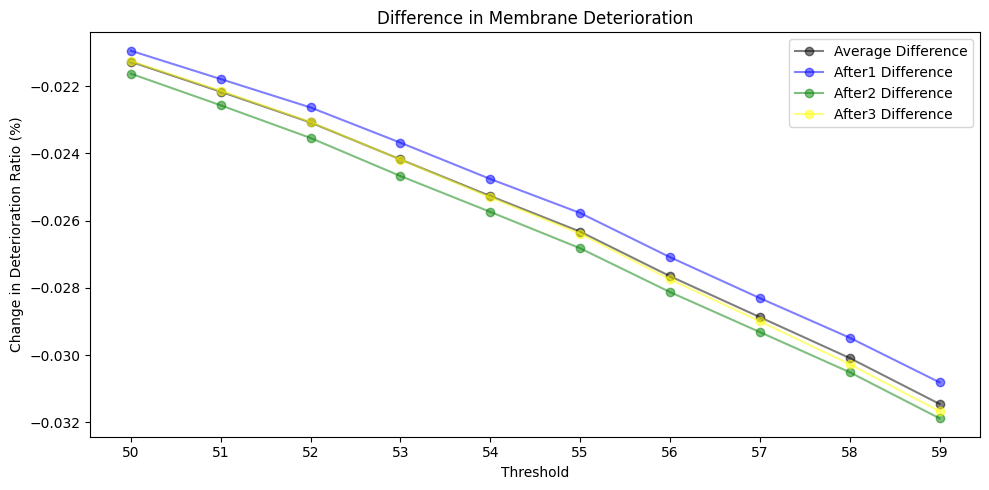

In [ ]:
 from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# 이미지 파일 열기
img1 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/img_org.png')
img2 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image01.png')
img3 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image02.png')
img4 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image03.png')

# 이미지 크기 맞추기
width, height = img1.size
img2 = img2.resize((width, height))
img3 = img3.resize((width, height))
img4 = img4.resize((width, height))

thresholds = range(50, 60)
average_diffs = []
average_diffs1 = []
average_diffs2 = []
average_diffs3 = []

for threshold in thresholds:
    print("THRESHOLD OF PORE REPRESENTATION:", threshold)
    black_ratios = []

    for img in [img1, img2, img3, img4]:
        black_pixels = sum([1 for pixel in img.getdata() if sum(pixel)/3 >= threshold])
        count = img.size[0] * img.size[1]
        black_ratios.append(black_pixels / count)

    # 검은색 비율 차이 계산하기(처리효율 개념으로 가정만)
    black_ratio_diffs = [(black_ratios[0] - black_ratios[i])/(black_ratios[0]) for i in range(1, 4)]
    average_diff = sum(black_ratio_diffs) / 3
    average_diffs.append(average_diff)
    average_diffs1.append(black_ratio_diffs[0])
    average_diffs2.append(black_ratio_diffs[1])
    average_diffs3.append(black_ratio_diffs[2])
    print(f"Threshold {threshold}: Average difference: {average_diff}")

# 차이값을 나타내는 선 그래프 그리기
fig, ax = plt.subplots(figsize=(10, 5))

x = np.arange(len(thresholds))
y = np.array(average_diffs)
y1 = np.array(average_diffs1)
y2 = np.array(average_diffs2)
y3 = np.array(average_diffs3)

ax.plot(x, y, 'ro-', label='Average Difference', color='black', alpha=0.5)
ax.plot(x, y1, 'bo-', label='After1 Difference', color='blue', alpha=0.5)
ax.plot(x, y2, 'go-', label='After2 Difference', color='green', alpha=0.5)
ax.plot(x, y3, 'yo-', label='After3 Difference', color='yellow', alpha=0.5)

ax.set_xticks(x)
ax.set_xticklabels(thresholds)
ax.set_xlabel('Threshold')
ax.set_ylabel('Change in Deterioration Ratio (%)')
ax.set_title('Difference in Membrane Deterioration')
ax.legend()

plt.tight_layout()
plt.show()


In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# 이미지 파일 열기
img1 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/img_org.png')
img2 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image01.png')
img3 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image02.png')
img4 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image03.png')

# 이미지 크기 맞추기
width, height = img1.size
img2 = img2.resize((width, height))
img3 = img3.resize((width, height))
img4 = img4.resize((width, height))

thresholds = range(85, 104)
average_diffs = []
average_diffs1 = []
average_diffs2 = []
average_diffs3 = []
black_ratios = []
#initial_pore_ratios = []

for threshold in thresholds:
#    initial_pore_ratios.append(black_ratios[0])
    print("THRESHOLD OF PORE REPRESENTATION:", threshold)
#    black_ratios = []
    # Add this line inside the loop, after calculating black_ratios
#
    for img in [img1, img2, img3, img4]:
        black_pixels = sum([1 for pixel in img.getdata() if sum(pixel)/3 <= threshold])
        count = img.size[0] * img.size[1]
        black_ratios.append(black_pixels / count)

    # 검은색 비율 차이 계산하기(처리효율 개념으로 가정만)
    black_ratio_diffs = [(black_ratios[0] - black_ratios[i])/(black_ratios[0]) for i in range(1, 4)]
    average_diff = sum(black_ratio_diffs) / 3
    average_diffs.append(average_diff)
    average_diffs1.append(black_ratio_diffs[0])
    average_diffs2.append(black_ratio_diffs[1])
    average_diffs3.append(black_ratio_diffs[2])
    print(f"Threshold {threshold}: Average difference: {average_diff}")
    print(f"Threshold {threshold}: initial Pore Estimated Value for New Membrane == {(black_ratios[0])*100} %")

# 차이값을 나타내는 선 그래프 그리기
fig, ax = plt.subplots(figsize=(10, 5))

x = np.arange(len(thresholds))
y = np.array(average_diffs)
y1 = np.array(average_diffs1)
y2 = np.array(average_diffs2)
y3 = np.array(average_diffs3)

ax.plot(x, y, 'ro-', label='Average Difference', color='orange', alpha=0.9)
ax.plot(x, y1, 'bo-', label='After1 Difference', color='blue', alpha=0.5)
ax.plot(x, y2, 'go-', label='After2 Difference', color='green', alpha=0.5)
ax.plot(x, y3, 'yo-', label='After3 Difference', color='gray', alpha=0.5)

ax.set_xticks(x)
ax.set_xticklabels(thresholds)
ax.set_xlabel('Threshold')
ax.set_ylabel('Change in Deterioration Ratio (%)')
ax.set_title('Difference in Membrane Deterioration')
ax.legend()

plt.tight_layout()
plt.show()

#### 추가버전
#### 초기의 공극비율을 판단하는 그래프를 추가함 
fig, ax = plt.subplots(figsize=(10, 5))
xp = np.arange(len(thresholds))
#yp = np.array(black_ratios[0])
yp = (np.array(initial_pore_ratios))*100


ax.plot(xp, yp, 'o-', label='Initial Pore', color='blue', alpha=0.5)

ax.set_xlabel('Thresholds')
ax.set_ylabel('Pore Ratios')
ax.set_title('Initial Pore Estimation for New Membrane')

ax.set_xticks(xp)
ax.set_xticklabels(thresholds)

plt.tight_layout()
plt.show()
####|





## **###### 합리적 범위인 최초 공극 10%(9.5% 초과) 에서 15%(16% 미만) 사이를 나타내는 초기 threshold값에 대해서 그래프 분석을 실시함**

THRESHOLD OF PORE REPRESENTATION: 88
diff1:===>> 0.5694919715714661
diff2:===>> 0.5968675967359832
diff3:===>> 0.7136088444327454
diff4:===>> 0.8533824690708081


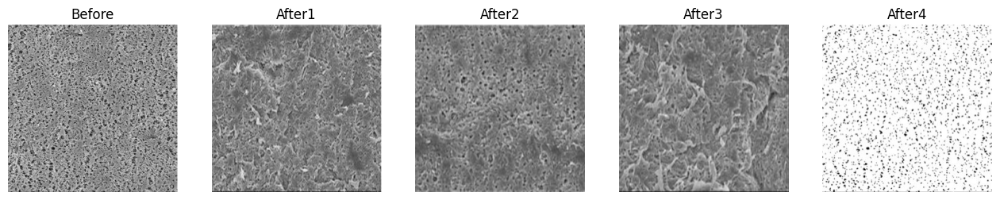

<ipython-input-5-e409f2ee82b7>:164: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro-" (-> color='r'). The keyword argument will take precedence.
  axes[1].plot(x_diff, y_diff, 'ro-', label='Difference', color='black')


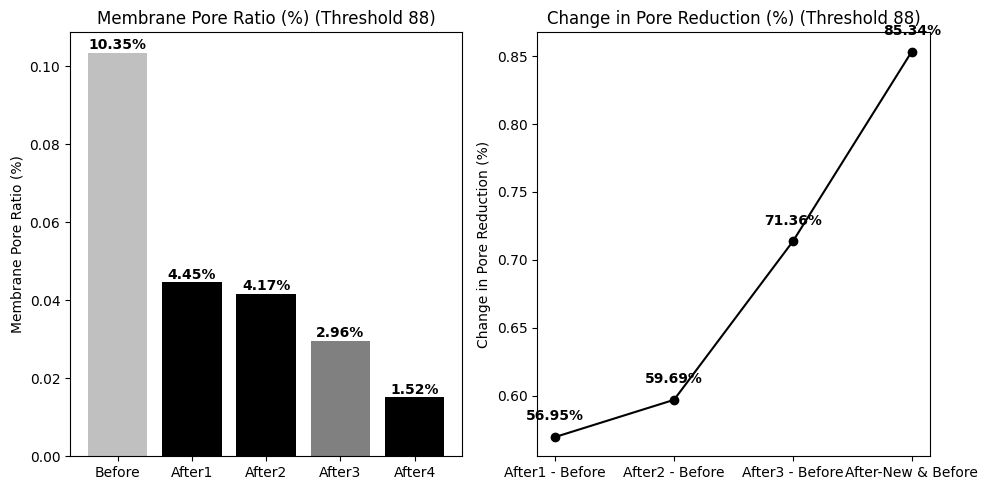

threshold===== 88 was treated
THRESHOLD OF PORE REPRESENTATION: 89
diff1:===>> 0.5410819086501659
diff2:===>> 0.5662158713957642
diff3:===>> 0.6918856851237561
diff4:===>> 0.8530237305435061


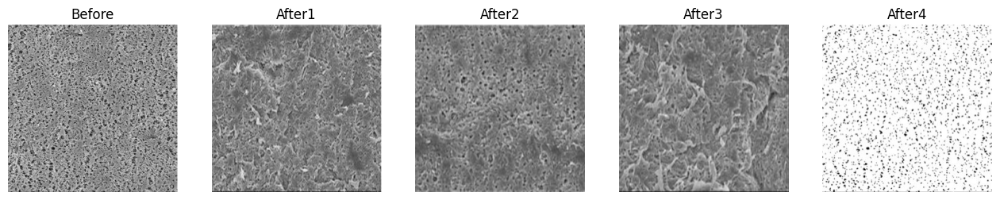

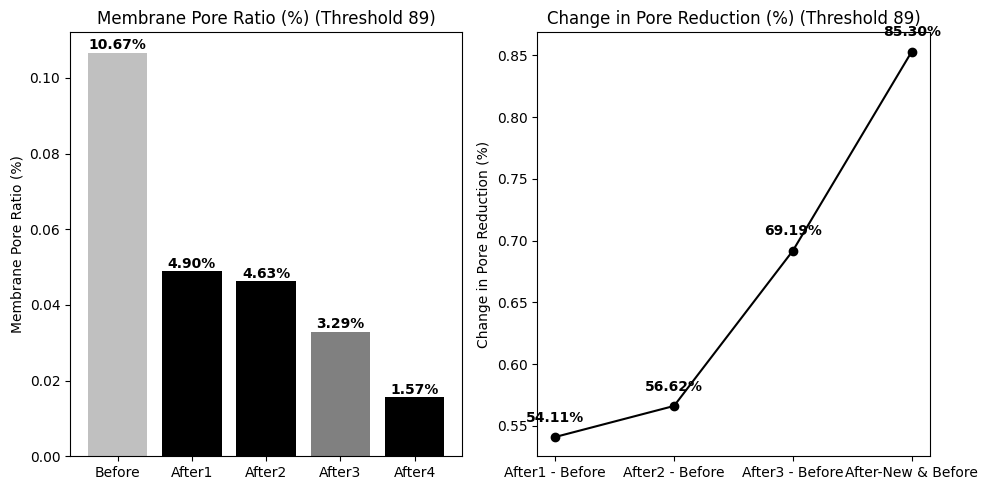

threshold===== 89 was treated
THRESHOLD OF PORE REPRESENTATION: 91
diff1:===>> 0.47581809432146294
diff2:===>> 0.4985563041385948
diff3:===>> 0.6455726660250241
diff4:===>> 0.8545476419634264


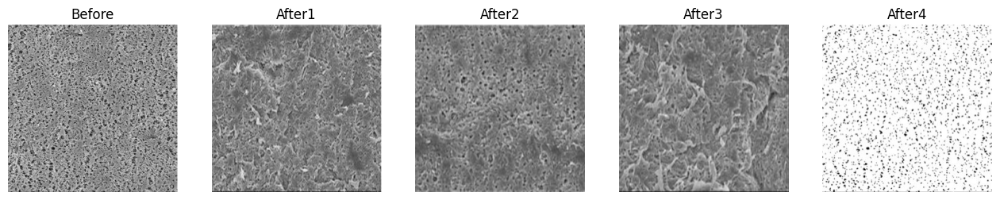

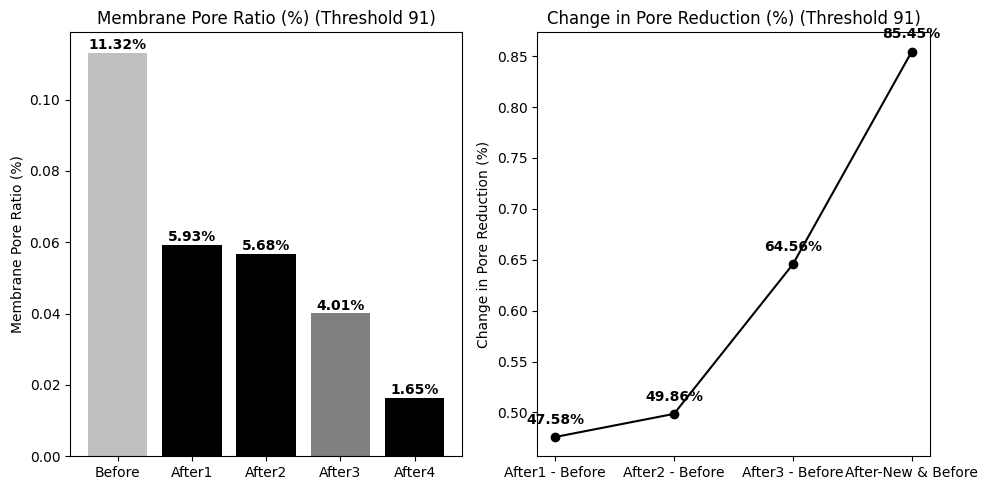

threshold===== 91 was treated
THRESHOLD OF PORE REPRESENTATION: 93
diff1:===>> 0.4086701286972228
diff2:===>> 0.4189433280650259
diff3:===>> 0.5927974712124633
diff4:===>> 0.8580943779634229


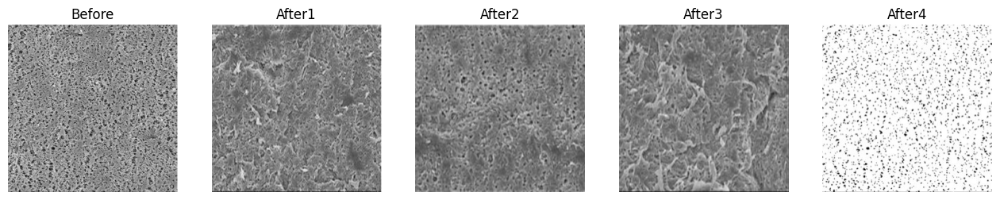

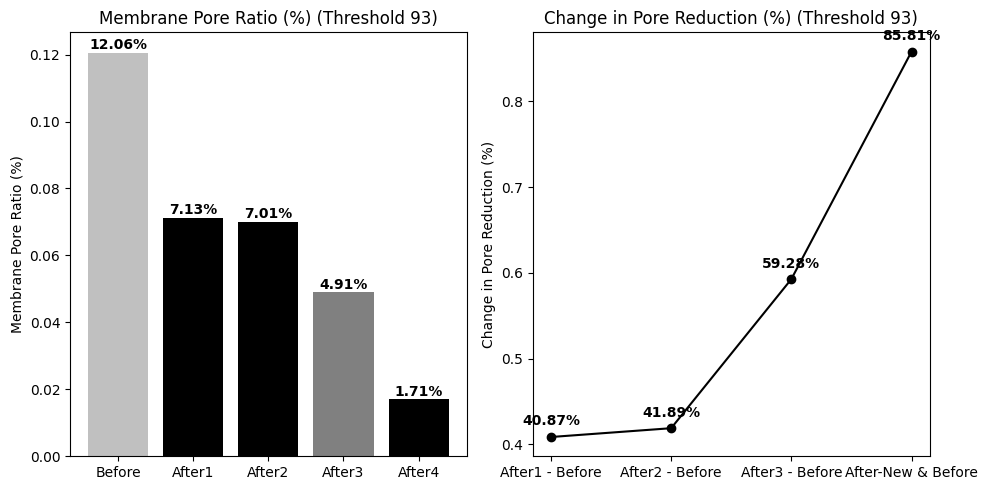

threshold===== 93 was treated
THRESHOLD OF PORE REPRESENTATION: 95
diff1:===>> 0.34304790165324295
diff2:===>> 0.34463755828740994
diff3:===>> 0.5280839338702841
diff4:===>> 0.8602161933022467


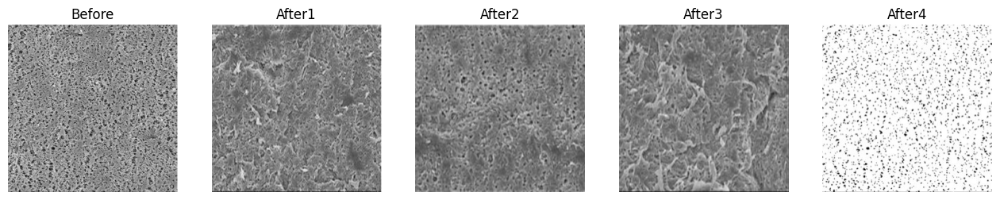

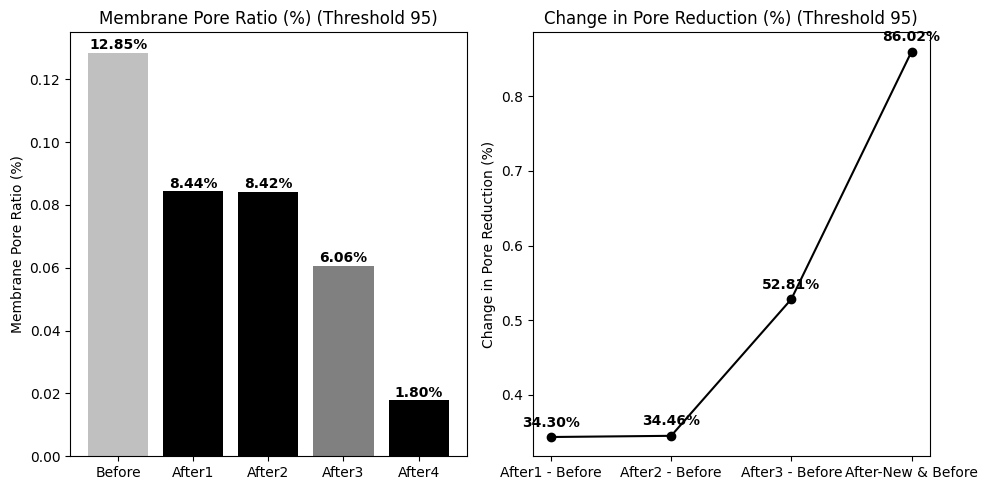

threshold===== 95 was treated
THRESHOLD OF PORE REPRESENTATION: 97
diff1:===>> 0.2669390195296932
diff2:===>> 0.25757273814268633
diff3:===>> 0.45964527700279
diff4:===>> 0.8627939418094859


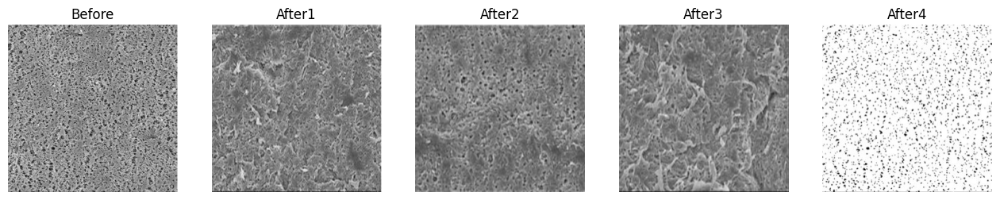

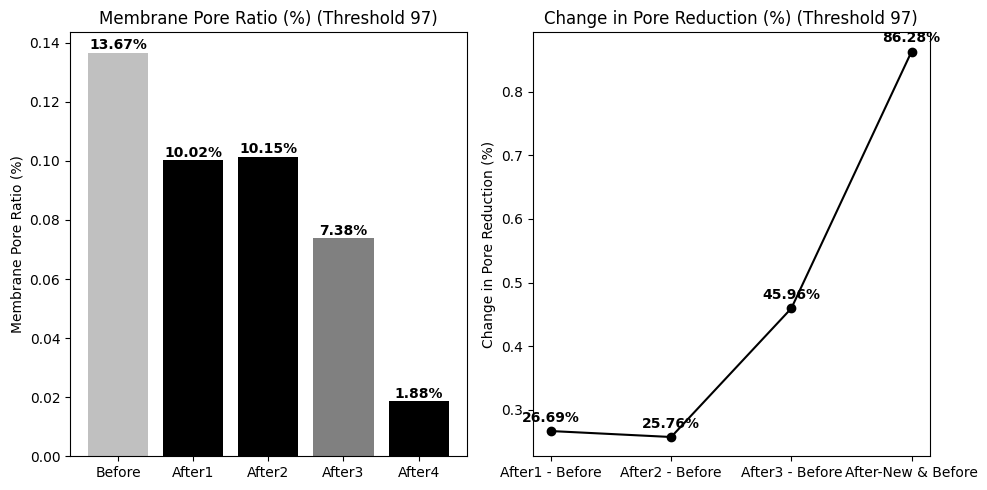

threshold===== 97 was treated
THRESHOLD OF PORE REPRESENTATION: 99
diff1:===>> 0.18016575626294978
diff2:===>> 0.15925786400452072
diff3:===>> 0.3800150687511773
diff4:===>> 0.8654172160482201


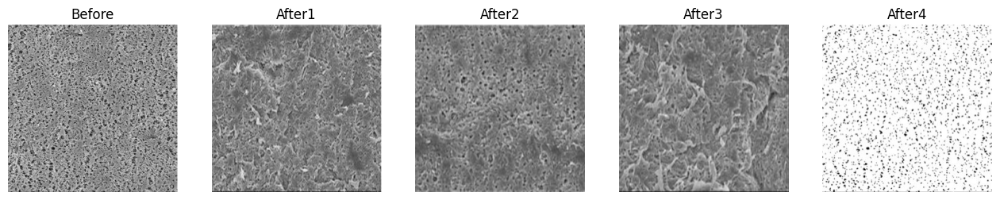

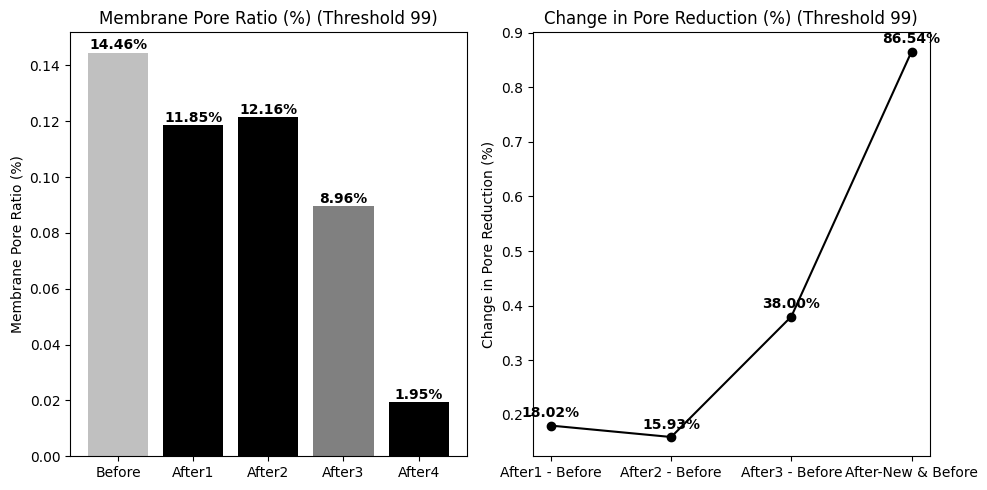

threshold===== 99 was treated
THRESHOLD OF PORE REPRESENTATION: 101
diff1:===>> 0.09375278495677743
diff2:===>> 0.06728455574369484
diff3:===>> 0.29355672399964355
diff4:===>> 0.8656982443632475


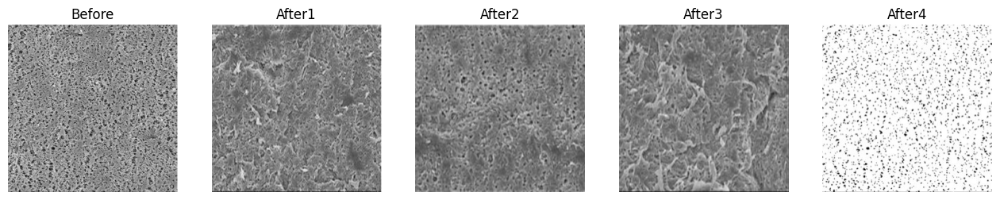

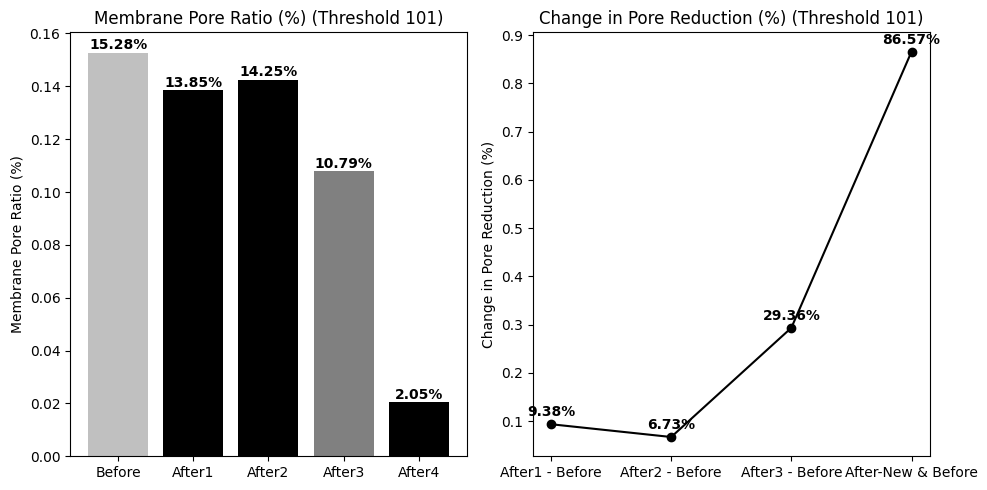

threshold===== 101 was treated
THRESHOLD OF PORE REPRESENTATION: 103
diff1:===>> 0.003128434937008596
diff2:===>> -0.026295763929990695
diff3:===>> 0.19886699923902937
diff4:===>> 0.8670837913249345


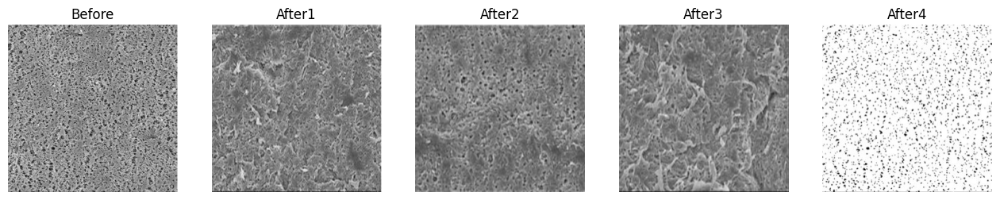

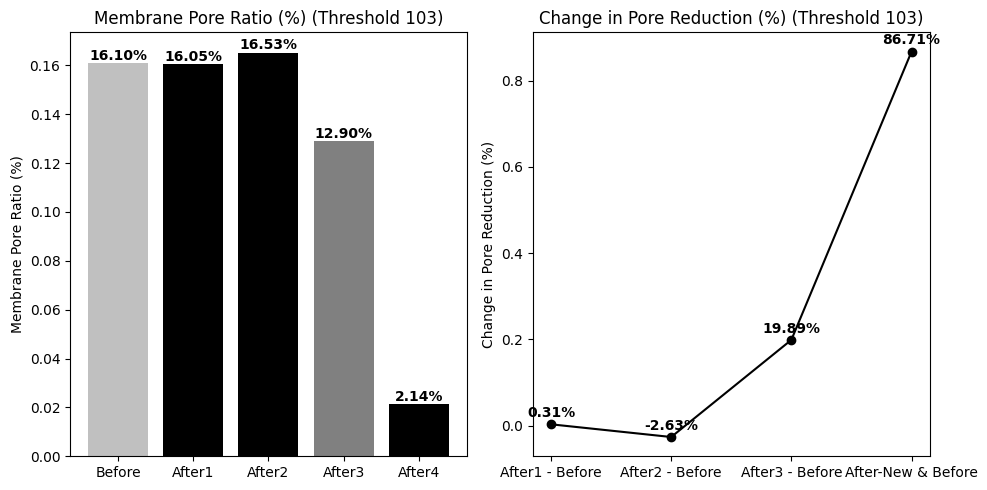

threshold===== 103 was treated


In [ ]:

#################### 3개의 threshold 값에 대해서 현재 까지 합친 버전 

# from PIL import Image # 반전이미지 처리를 위한 ImageOps 추가 
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# 검은색 농도의 임계값 리스트
thresholds = [88, 89, 91, 93, 95, 97, 99, 101, 103]
#thresholds = [50, 60, 70, 80, 128, 150, 200, 250]
#thresholds = [110, 128, 150]


def main():
    # 각 임계값에 대해 이미지 처리 및 출력
    for threshold in thresholds:
        process_images(threshold)

def process_images(threshold):
     # 이미지 파일 열기
    img1 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/img_org.png')
    img2 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image01.png')
    img3 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image02.png')
    img4 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image03.png')
    img5 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/new_mem_rev.png')

#    img4 = ImageOps.invert(img4)
    #img5 = ImageOps.invert(img5)

    # 이미지 크기 맞추기
    width, height = img1.size
    img2 = img2.resize((width, height))
    img3 = img3.resize((width, height))
    img4 = img4.resize((width, height))
    img5 = img5.resize((width, height))


    # 검은색 농도의 임계값 설정
    print("THRESHOLD OF PORE REPRESENTATION:", threshold)

   # 검은색 픽셀 수
    black_pixels1 = 0
    black_pixels2 = 0
    black_pixels3 = 0
    black_pixels4 = 0
    black_pixels5 = 0
    count = 0 

    for x in range(width):
      for y in range(height):

     # 해당 픽셀의 RGB 값을 가져오기
        r1, g1, b1 = img1.getpixel((x, y))
        r2, g2, b2 = img2.getpixel((x, y))
        r3, g3, b3 = img3.getpixel((x, y))
        r4, g4, b4 = img4.getpixel((x, y))
        r5, g5, b5 = img5.getpixel((x, y))
    
    # RGB 값을 평균하여 밝기 계산하기
    brightness1 = (r1 + g1 + b1) / 3
    brightness2 = (r2 + g2 + b2) / 3
    brightness3 = (r3 + g3 + b3) / 3
    brightness4 = (r4 + g4 + b4) / 3
    brightness5 = (r5 + g5 + b5) / 3

    
    # # 검은색 농도가 임계값 이상인 경우 black_pixels 값을 증가시킴
    # if brightness1 >= threshold:
    #     black_pixels1 += 1
    # if brightness2 >= threshold:
    #     black_pixels2 += 1
    # if brightness3 >= threshold:
    #     black_pixels3 += 1
    # if brightness4 >= threshold:
    #     black_pixels4 += 1
    # if brightness4 >= threshold:
    #     black_pixels5 += 1

    black_pixels1 = sum([1 for pixel in img1.getdata() if sum(pixel)/3 <= threshold])
    black_pixels2 = sum([1 for pixel in img2.getdata() if sum(pixel)/3 <= threshold])
    black_pixels3 = sum([1 for pixel in img3.getdata() if sum(pixel)/3 <= threshold])
    black_pixels4 = sum([1 for pixel in img4.getdata() if sum(pixel)/3 <= threshold])
    black_pixels5 = sum([1 for pixel in img5.getdata() if sum(pixel)/3 <= threshold])
    
    #각 이미지의 픽셀 수 계산
    count1 = img1.size[0] * img1.size[1]
    count2 = img2.size[0] * img2.size[1]
    count3 = img3.size[0] * img3.size[1]
    count4 = img4.size[0] * img4.size[1]
    count5 = img5.size[0] * img5.size[1]


    # 각 이미지의 검은색 비율 계산
    black_ratio1 = black_pixels1 / count1
    black_ratio2 = black_pixels2 / count2
    black_ratio3 = black_pixels3 / count3
    black_ratio4 = black_pixels4 / count4    
    black_ratio5 = black_pixels5 / count5


    # 공극 비율 차이 계산하기
    black_ratio_diff1 = (black_ratio1 - black_ratio2)/black_ratio1
    black_ratio_diff2 = (black_ratio1 - black_ratio3)/black_ratio1
    black_ratio_diff3 = (black_ratio1 - black_ratio4)/black_ratio1
    black_ratio_diff4 = (black_ratio1 - black_ratio5)/black_ratio1

    for i in range(4):
        if i == 0:
            diff = black_ratio_diff1
        elif i == 1:
            diff = black_ratio_diff2
        elif i == 2:
            diff = black_ratio_diff3
        else:
            diff = black_ratio_diff4
        print(f"diff{i+1}:===>> {diff}")

    # 이미지 그리기
    img_list = [img1, img2, img3, img4, img5]
    black_ratios = [black_ratio1, black_ratio2, black_ratio3, black_ratio4, black_ratio5]
    black_ratio_diffs = [black_ratio_diff1, black_ratio_diff2, black_ratio_diff3, black_ratio_diff4]
    plot_images(img_list, black_ratios, black_ratio_diffs, threshold)
    print(f"threshold===== {threshold} was treated")

def plot_images(img_list, black_ratios, black_ratio_diffs, threshold):
    fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(16, 5))

    for i, img in enumerate(img_list):
        axes[i].imshow(img)
        axes[i].set_title(f"After{i}" if i > 0 else "Before")
        axes[i].axis("off")

    plt.show()

#########################
#비교 차트 부분 - 뒤 코드에 
#########################

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

    # 차트1: 막대 차트 그리기
    x = np.arange(5)
    y = np.array(black_ratios)
    labels = ['Before', 'After1', 'After2', 'After3', 'After4']
    colors = ['#C0C0C0', 'black', 'black', 'gray', 'black']

    axes[0].bar(x, y, color=colors)
    axes[0].set_xticks(x)
    axes[0].set_xticklabels(labels)
    axes[0].set_ylabel('Membrane Pore Ratio (%)')
    axes[0].set_title(f'Membrane Pore Ratio (%) (Threshold {threshold})')

    # 막대 차트에 텍스트 삽입
    for i, val in enumerate(y):
            axes[0].text(i, val+0.0001, "{:.2f}%".format(val * 100), ha='center', va='bottom', fontweight='bold')

    # 차트2: 차이값을 나타내는 선 그래프 그리기
    x_diff = np.arange(4)
    y_diff = np.array(black_ratio_diffs)
    labels_diff = ['After1 - Before', 'After2 - Before', 'After3 - Before', 'After-New & Before']
    colors_diff = ['black', 'black', 'gray','black']

    axes[1].plot(x_diff, y_diff, 'ro-', label='Difference', color='black')
    axes[1].set_xticks(x_diff)
    axes[1].set_xticklabels(labels_diff)
    axes[1].set_ylabel('Change in Pore Reduction (%)')
    axes[1].set_title(f'Change in Pore Reduction (%) (Threshold {threshold})')


    # 차트2에 텍스트 삽입
    for i, diff in enumerate(y_diff):
        axes[1].text(i, diff+0.01, "{:.2f}%".format(diff * 100), ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()
    plt.show()


if __name__ == "__main__":
    main()


### 반전해서 분석해 보았으나 큰 의미차이는 없는 수준으로 원본으로 회귀하는 것으로 잠정적으로 결론 내림 

THRESHOLD OF PORE REPRESENTATION: 85
Threshold 85: Average difference: -0.17113291763486513
Threshold 85: initial Pore Estimated Value for New Membrane == 81.45621416996882 %
THRESHOLD OF PORE REPRESENTATION: 86
Threshold 86: Average difference: -0.18179202491368227
Threshold 86: initial Pore Estimated Value for New Membrane == 80.45535629178751 %
THRESHOLD OF PORE REPRESENTATION: 87
Threshold 87: Average difference: -0.19294576168515373
Threshold 87: initial Pore Estimated Value for New Membrane == 79.4272641856285 %
THRESHOLD OF PORE REPRESENTATION: 88
Threshold 88: Average difference: -0.20324144794704443
Threshold 88: initial Pore Estimated Value for New Membrane == 78.44547026703161 %
THRESHOLD OF PORE REPRESENTATION: 89
Threshold 89: Average difference: -0.2148425813491016
Threshold 89: initial Pore Estimated Value for New Membrane == 77.376526818906 %
THRESHOLD OF PORE REPRESENTATION: 90
Threshold 90: Average difference: -0.2278254138382755
Threshold 90: initial Pore Estimated V

<ipython-input-6-0031ab386b3b>:60: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro-" (-> color='r'). The keyword argument will take precedence.
  ax.plot(x, y, 'ro-', label='Average Difference', color='orange', alpha=0.9)
<ipython-input-6-0031ab386b3b>:61: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo-" (-> color='b'). The keyword argument will take precedence.
  ax.plot(x, y1, 'bo-', label='After1 Difference', color='blue', alpha=0.5)
<ipython-input-6-0031ab386b3b>:62: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "go-" (-> color='g'). The keyword argument will take precedence.
  ax.plot(x, y2, 'go-', label='After2 Difference', color='green', alpha=0.5)
<ipython-input-6-0031ab386b3b>:63: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "yo-" (-> color='y'). The keyword argument will take precedenc

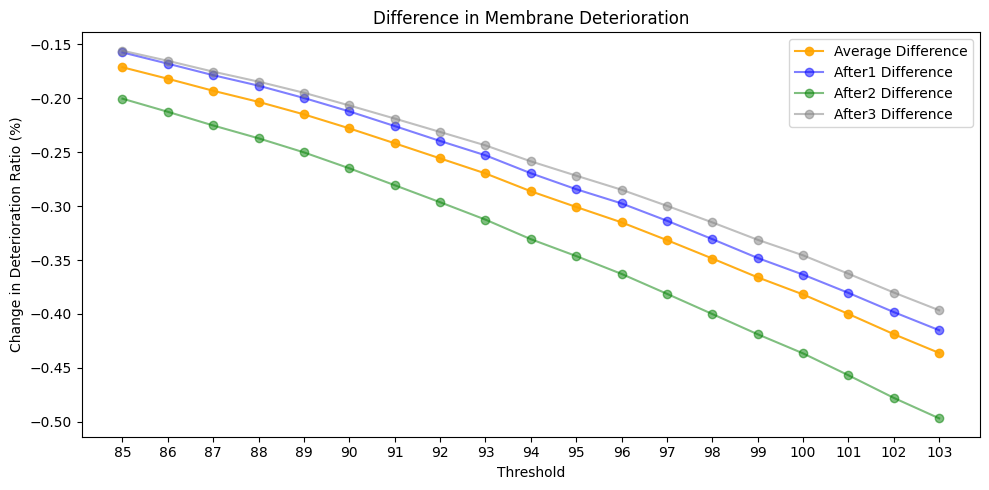

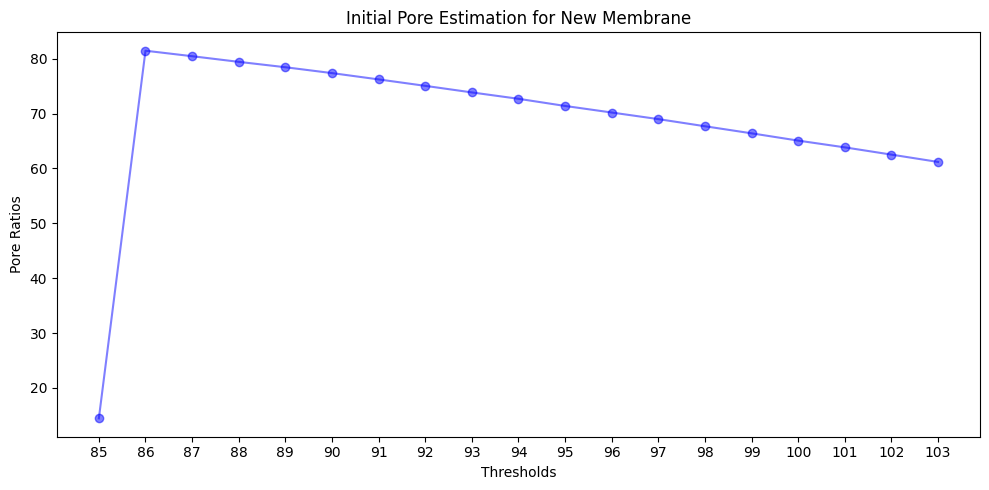

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# 이미지 파일 열기
img1 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/img_org.png')
img2 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image01.png')
img3 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image02.png')
img4 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image03.png')

# 이미지 크기 맞추기
width, height = img1.size
img2 = img2.resize((width, height))
img3 = img3.resize((width, height))
img4 = img4.resize((width, height))

img1 = ImageOps.invert(img1)
img2 = ImageOps.invert(img2)
img3 = ImageOps.invert(img3)
img4 = ImageOps.invert(img4)

thresholds = range(85, 104)
average_diffs = []
average_diffs1 = []
average_diffs2 = []
average_diffs3 = []
#
initial_pore_ratios = []

for threshold in thresholds:
    initial_pore_ratios.append(black_ratios[0])
    print("THRESHOLD OF PORE REPRESENTATION:", threshold)
    black_ratios = []
    # Add this line inside the loop, after calculating black_ratios
#
    for img in [img1, img2, img3, img4]:
        black_pixels = sum([1 for pixel in img.getdata() if sum(pixel)/3 >= threshold])
        count = img.size[0] * img.size[1]
        black_ratios.append(black_pixels / count)

    # 검은색 비율 차이 계산하기(처리효율 개념으로 가정만)
    black_ratio_diffs = [(black_ratios[0] - black_ratios[i])/(black_ratios[0]) for i in range(1, 4)]
    average_diff = sum(black_ratio_diffs) / 3
    average_diffs.append(average_diff)
    average_diffs1.append(black_ratio_diffs[0])
    average_diffs2.append(black_ratio_diffs[1])
    average_diffs3.append(black_ratio_diffs[2])
    print(f"Threshold {threshold}: Average difference: {average_diff}")
    print(f"Threshold {threshold}: initial Pore Estimated Value for New Membrane == {(black_ratios[0])*100} %")

# 차이값을 나타내는 선 그래프 그리기
fig, ax = plt.subplots(figsize=(10, 5))

x = np.arange(len(thresholds))
y = np.array(average_diffs)
y1 = np.array(average_diffs1)
y2 = np.array(average_diffs2)
y3 = np.array(average_diffs3)

ax.plot(x, y, 'ro-', label='Average Difference', color='orange', alpha=0.9)
ax.plot(x, y1, 'bo-', label='After1 Difference', color='blue', alpha=0.5)
ax.plot(x, y2, 'go-', label='After2 Difference', color='green', alpha=0.5)
ax.plot(x, y3, 'yo-', label='After3 Difference', color='gray', alpha=0.5)

ax.set_xticks(x)
ax.set_xticklabels(thresholds)
ax.set_xlabel('Threshold')
ax.set_ylabel('Change in Deterioration Ratio (%)')
ax.set_title('Difference in Membrane Deterioration')
ax.legend()

plt.tight_layout()
plt.show()

#### 추가버전
#### 초기의 공극비율을 판단하는 그래프를 추가함 
fig, ax = plt.subplots(figsize=(10, 5))
xp = np.arange(len(thresholds))
#yp = np.array(black_ratios[0])
yp = (np.array(initial_pore_ratios))*100


ax.plot(xp, yp, 'o-', label='Initial Pore', color='blue', alpha=0.5)

ax.set_xlabel('Thresholds')
ax.set_ylabel('Pore Ratios')
ax.set_title('Initial Pore Estimation for New Membrane')

ax.set_xticks(xp)
ax.set_xticklabels(thresholds)

plt.tight_layout()
plt.show()
####|





In [ ]:
## **###### 반전시키고 그래프 뽑아봄

THRESHOLD OF PORE REPRESENTATION: 77
diff1:===>> 0.6837426380708967
diff2:===>> 0.9088787643071452
diff3:===>> 0.7130792310256695
diff4:===>> -6.512168018668741


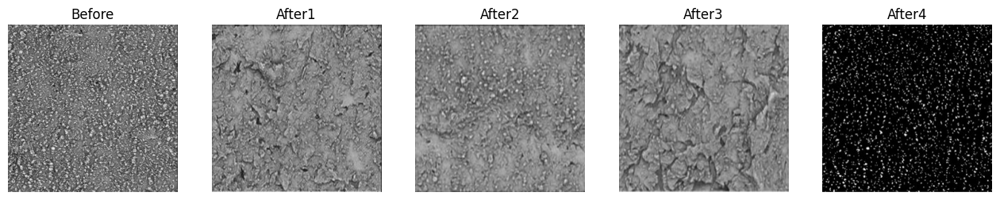

<ipython-input-7-5d971935aadb>:170: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro-" (-> color='r'). The keyword argument will take precedence.
  axes[1].plot(x_diff, y_diff, 'ro-', label='Difference', color='black')


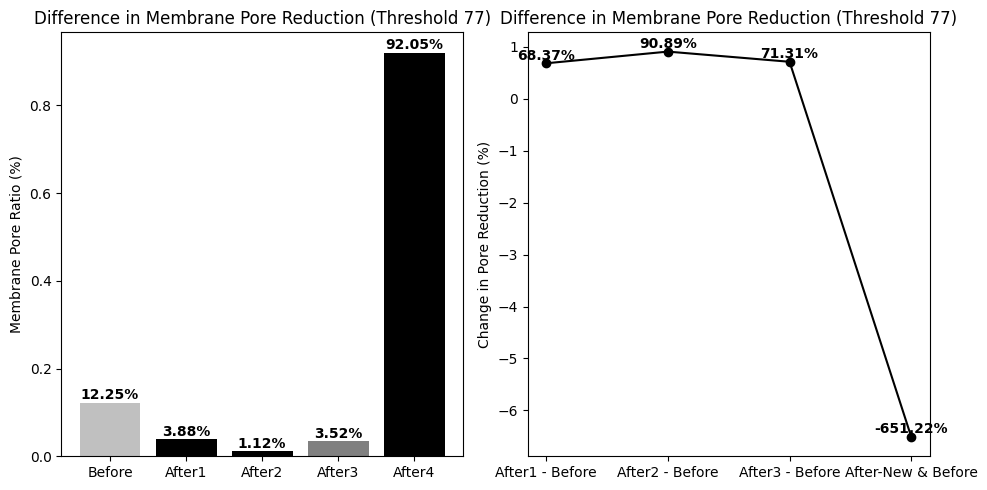

threshold===== 77 was treated
THRESHOLD OF PORE REPRESENTATION: 79
diff1:===>> 0.6885758998435054
diff2:===>> 0.9006259780907669
diff3:===>> 0.7053012519561815
diff4:===>> -5.632433489827856


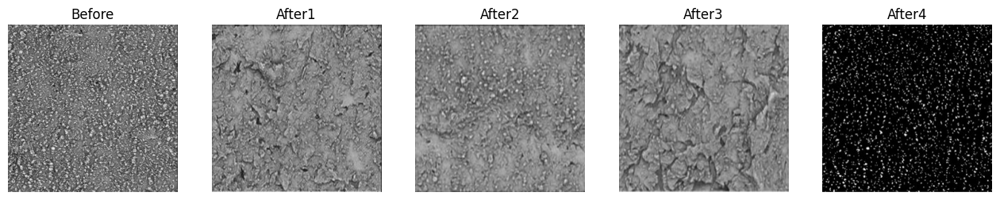

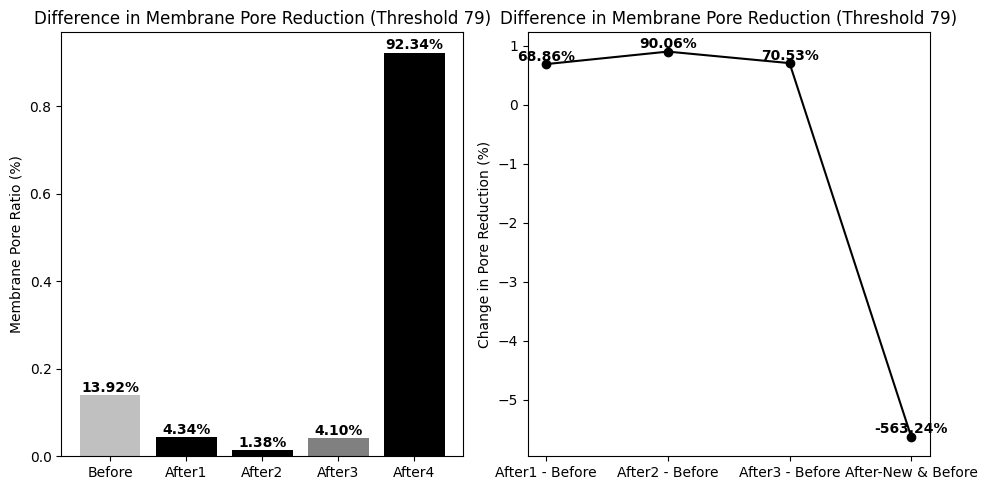

threshold===== 79 was treated
THRESHOLD OF PORE REPRESENTATION: 81
diff1:===>> 0.692147143229846
diff2:===>> 0.8939907818071136
diff3:===>> 0.6969301678406817
diff4:===>> -4.914688233759458


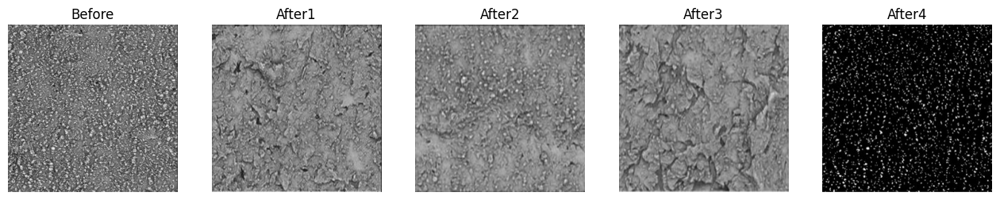

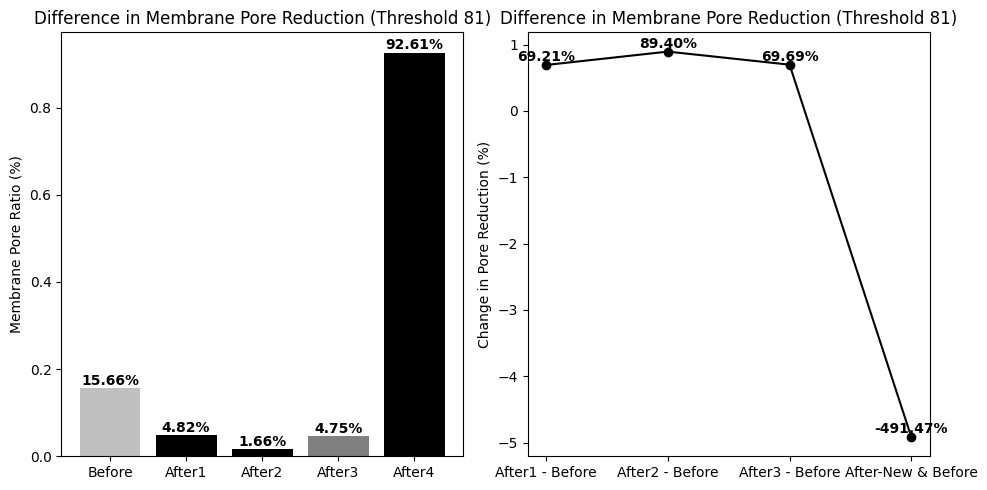

threshold===== 81 was treated
THRESHOLD OF PORE REPRESENTATION: 83
diff1:===>> 0.6913772922356614
diff2:===>> 0.8841201716738197
diff3:===>> 0.6854467420991026
diff4:===>> -4.319157237612173


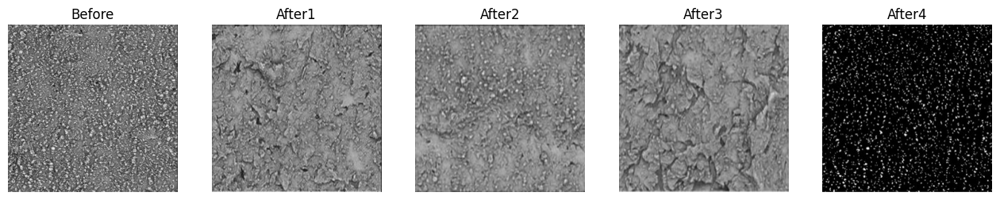

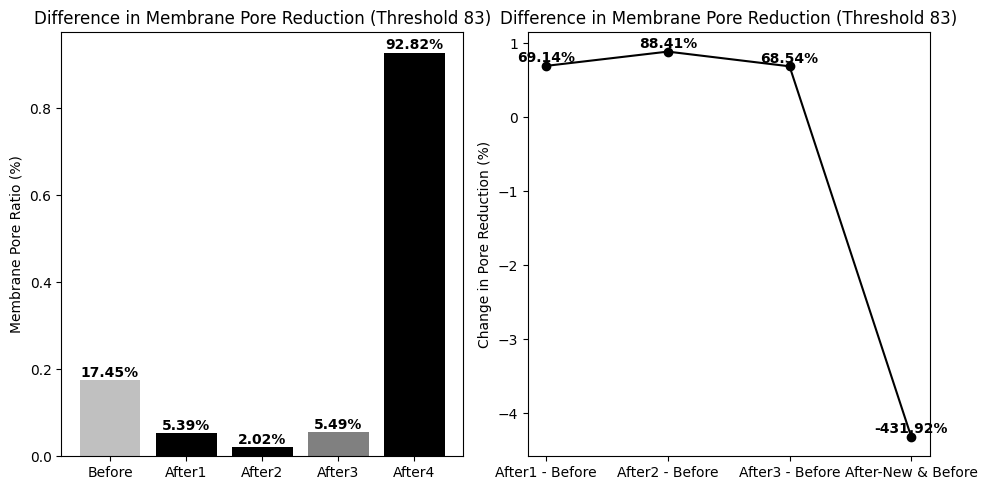

threshold===== 83 was treated
THRESHOLD OF PORE REPRESENTATION: 85
diff1:===>> 0.690726677349683
diff2:===>> 0.8745210060614506
diff3:===>> 0.679788197589354
diff4:===>> -3.7616526161778023


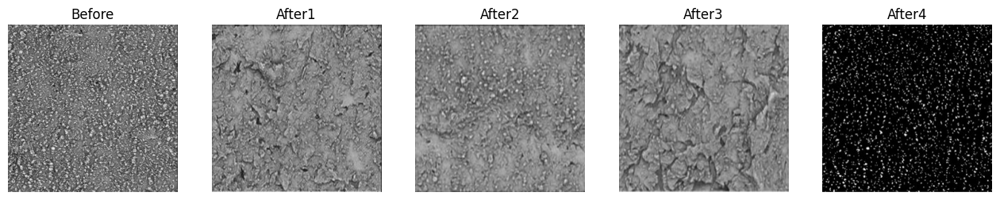

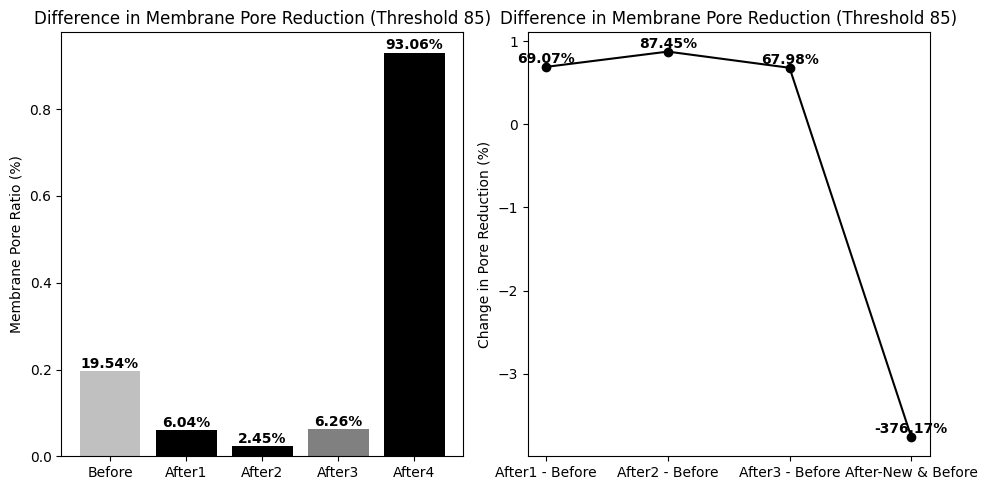

threshold===== 85 was treated
THRESHOLD OF PORE REPRESENTATION: 87
diff1:===>> 0.6850085286499463
diff2:===>> 0.8626571482721587
diff3:===>> 0.6713626887358646
diff4:===>> -3.3298376397750964


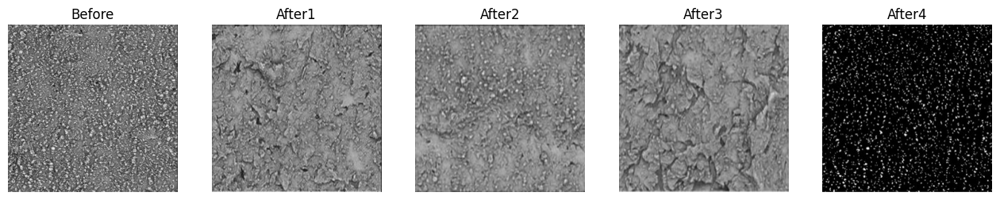

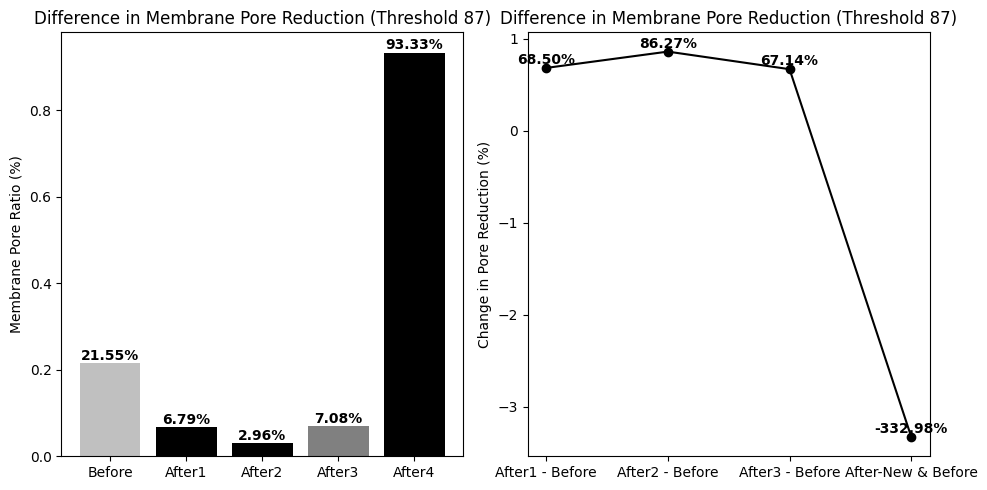

threshold===== 87 was treated
THRESHOLD OF PORE REPRESENTATION: 89
diff1:===>> 0.680071031677837
diff2:===>> 0.8492868190410724
diff3:===>> 0.6623703958297532
diff4:===>> -2.9356132210574555


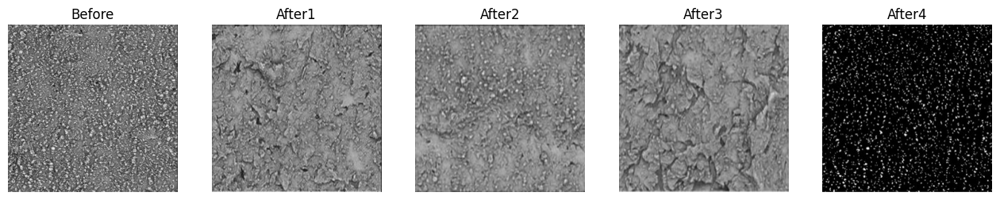

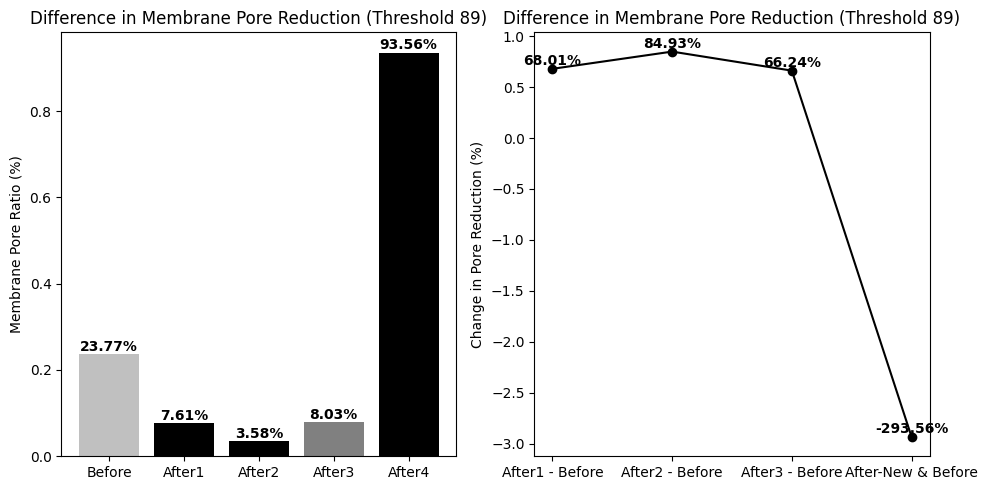

threshold===== 89 was treated
THRESHOLD OF PORE REPRESENTATION: 91
diff1:===>> 0.6765977394655971
diff2:===>> 0.8371269336944632
diff3:===>> 0.6529506745142976
diff4:===>> -2.5876868586905575


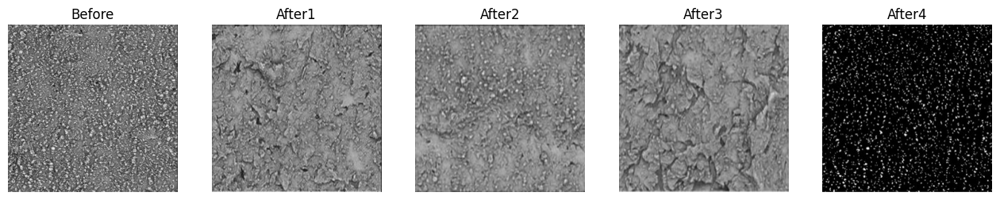

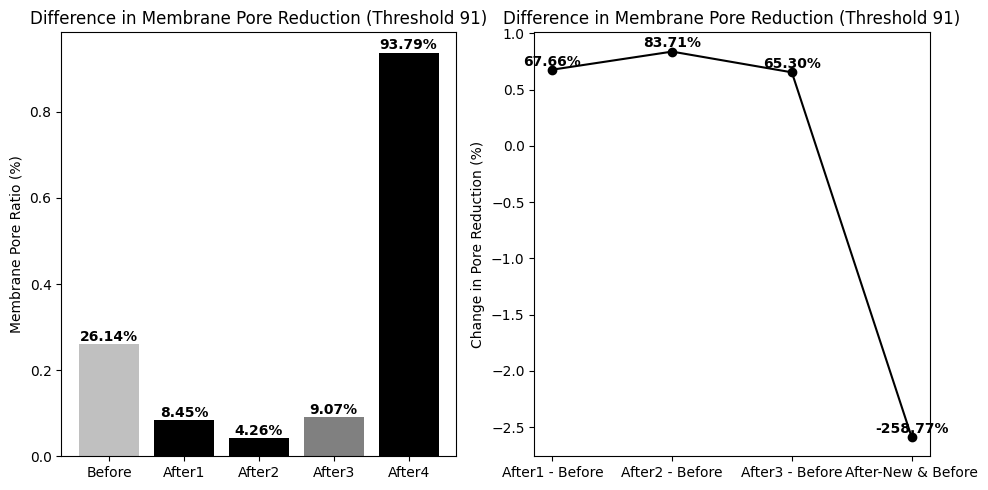

threshold===== 91 was treated


In [ ]:

#################### 3개의 threshold 값에 대해서 현재 까지 합친 버전 

# from PIL import Image # 반전이미지 처리를 위한 ImageOps 추가 
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# 검은색 농도의 임계값 리스트
thresholds = [77, 79, 81, 83, 85, 87, 89, 91]
#thresholds = [50, 60, 70, 80, 128, 150, 200, 250]
#thresholds = [110, 128, 150]


def main():
    # 각 임계값에 대해 이미지 처리 및 출력
    for threshold in thresholds:
        process_images(threshold)

def process_images(threshold):
     # 이미지 파일 열기
    img1 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/img_org.png')
    img2 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image01.png')
    img3 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image02.png')
    img4 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/image03.png')
    img5 = Image.open('/content/drive/MyDrive/Colab Notebooks/2023_Apr_Membrane/new_mem_rev.png')

    #img3 = ImageOps.invert(img2)
    #img5 = ImageOps.invert(img5)

    # 이미지 크기 맞추기
    width, height = img1.size
    img2 = img2.resize((width, height))
    img3 = img3.resize((width, height))
    img4 = img4.resize((width, height))
    img5 = img5.resize((width, height))

    img1 = ImageOps.invert(img1)
    img2 = ImageOps.invert(img2)
    img3 = ImageOps.invert(img3)
    img4 = ImageOps.invert(img4)
    img5 = ImageOps.invert(img5)


    # 검은색 농도의 임계값 설정
    print("THRESHOLD OF PORE REPRESENTATION:", threshold)

   # 검은색 픽셀 수
    black_pixels1 = 0
    black_pixels2 = 0
    black_pixels3 = 0
    black_pixels4 = 0
    black_pixels5 = 0
    count = 0 

    for x in range(width):
      for y in range(height):

     # 해당 픽셀의 RGB 값을 가져오기
        r1, g1, b1 = img1.getpixel((x, y))
        r2, g2, b2 = img2.getpixel((x, y))
        r3, g3, b3 = img3.getpixel((x, y))
        r4, g4, b4 = img4.getpixel((x, y))
        r5, g5, b5 = img5.getpixel((x, y))
    
    # RGB 값을 평균하여 밝기 계산하기
    brightness1 = (r1 + g1 + b1) / 3
    brightness2 = (r2 + g2 + b2) / 3
    brightness3 = (r3 + g3 + b3) / 3
    brightness4 = (r4 + g4 + b4) / 3
    brightness5 = (r5 + g5 + b5) / 3

    
    # # 검은색 농도가 임계값 이상인 경우 black_pixels 값을 증가시킴
    # if brightness1 >= threshold:
    #     black_pixels1 += 1
    # if brightness2 >= threshold:
    #     black_pixels2 += 1
    # if brightness3 >= threshold:
    #     black_pixels3 += 1
    # if brightness4 >= threshold:
    #     black_pixels4 += 1
    # if brightness4 >= threshold:
    #     black_pixels5 += 1

    black_pixels1 = sum([1 for pixel in img1.getdata() if sum(pixel)/3 <= threshold])
    black_pixels2 = sum([1 for pixel in img2.getdata() if sum(pixel)/3 <= threshold])
    black_pixels3 = sum([1 for pixel in img3.getdata() if sum(pixel)/3 <= threshold])
    black_pixels4 = sum([1 for pixel in img4.getdata() if sum(pixel)/3 <= threshold])
    black_pixels5 = sum([1 for pixel in img5.getdata() if sum(pixel)/3 <= threshold])
    
    #각 이미지의 픽셀 수 계산
    count1 = img1.size[0] * img1.size[1]
    count2 = img2.size[0] * img2.size[1]
    count3 = img3.size[0] * img3.size[1]
    count4 = img4.size[0] * img4.size[1]
    count5 = img5.size[0] * img5.size[1]


    # 각 이미지의 검은색 비율 계산
    black_ratio1 = black_pixels1 / count1
    black_ratio2 = black_pixels2 / count2
    black_ratio3 = black_pixels3 / count3
    black_ratio4 = black_pixels4 / count4    
    black_ratio5 = black_pixels5 / count5


    # 공극 비율 차이 계산하기
    black_ratio_diff1 = (black_ratio1 - black_ratio2)/black_ratio1
    black_ratio_diff2 = (black_ratio1 - black_ratio3)/black_ratio1
    black_ratio_diff3 = (black_ratio1 - black_ratio4)/black_ratio1
    black_ratio_diff4 = (black_ratio1 - black_ratio5)/black_ratio1

    for i in range(4):
        if i == 0:
            diff = black_ratio_diff1
        elif i == 1:
            diff = black_ratio_diff2
        elif i == 2:
            diff = black_ratio_diff3
        else:
            diff = black_ratio_diff4
        print(f"diff{i+1}:===>> {diff}")

    # 이미지 그리기
    img_list = [img1, img2, img3, img4, img5]
    black_ratios = [black_ratio1, black_ratio2, black_ratio3, black_ratio4, black_ratio5]
    black_ratio_diffs = [black_ratio_diff1, black_ratio_diff2, black_ratio_diff3, black_ratio_diff4]
    plot_images(img_list, black_ratios, black_ratio_diffs, threshold)
    print(f"threshold===== {threshold} was treated")

def plot_images(img_list, black_ratios, black_ratio_diffs, threshold):
    fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(16, 5))

    for i, img in enumerate(img_list):
        axes[i].imshow(img)
        axes[i].set_title(f"After{i}" if i > 0 else "Before")
        axes[i].axis("off")

    plt.show()

#########################
#비교 차트 부분 - 뒤 코드에 
#########################

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

    # 차트1: 막대 차트 그리기
    x = np.arange(5)
    y = np.array(black_ratios)
    labels = ['Before', 'After1', 'After2', 'After3', 'After4']
    colors = ['#C0C0C0', 'black', 'black', 'gray', 'black']

    axes[0].bar(x, y, color=colors)
    axes[0].set_xticks(x)
    axes[0].set_xticklabels(labels)
    axes[0].set_ylabel('Membrane Pore Ratio (%)')
    axes[0].set_title(f'Difference in Membrane Pore Reduction (Threshold {threshold})')

    # 막대 차트에 텍스트 삽입
    for i, val in enumerate(y):
            axes[0].text(i, val+0.0001, "{:.2f}%".format(val * 100), ha='center', va='bottom', fontweight='bold')

    # 차트2: 차이값을 나타내는 선 그래프 그리기
    x_diff = np.arange(4)
    y_diff = np.array(black_ratio_diffs)
    labels_diff = ['After1 - Before', 'After2 - Before', 'After3 - Before', 'After-New & Before']
    colors_diff = ['black', 'black', 'gray','black']

    axes[1].plot(x_diff, y_diff, 'ro-', label='Difference', color='black')
    axes[1].set_xticks(x_diff)
    axes[1].set_xticklabels(labels_diff)
    axes[1].set_ylabel('Change in Pore Reduction (%)')
    axes[1].set_title(f'Difference in Membrane Pore Reduction (Threshold {threshold})')


    # 차트2에 텍스트 삽입
    for i, diff in enumerate(y_diff):
        axes[1].text(i, diff+0.01, "{:.2f}%".format(diff * 100), ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()
    plt.show()


if __name__ == "__main__":
    main()
